Notebook to plot peri-ripple calcium activity.

In [32]:
import sys
sys.path.append('/data/GitHub/NeuroPy')
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
%load_ext autoreload
%autoreload 2

import neuropy.io.miniscopeio as msio

from neuropy import core
from neuropy.io import (optitrackio,
                        dlcio,
                        )
from neuropy.io.neuroscopeio import NeuroscopeIO
from neuropy.io.binarysignalio import BinarysignalIO 
from neuropy.io.miniscopeio import MiniscopeIO
from neuropy.io.minianio import MinianIO
from neuropy.core.ca_neurons import CaNeurons
from neuropy.plotting.ca_events import RasterGroup, Raster

# Make any figures saved open properly in illustrator
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['font.sans-serif'] = "Arial"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
basedir = '/data2//Trace_FC/Recording_Rats/Finn/2022_01_20_training'
miniscope = msio.MiniscopeIO(basedir)

In [3]:
# Define a class for a typical recording or set of recordings
class ProcessData:
    def __init__(self, basepath):
        basepath = Path(basepath)
        self.basepath = basepath
        xml_files = sorted(basepath.glob("*.xml"))
        assert len(xml_files) == 1, "Found more than one .xml file"
        
        fp = xml_files[0].with_suffix("")
        self.filePrefix = fp
        
        self.recinfo = NeuroscopeIO(xml_files[0])
        self.eegfile = BinarysignalIO(basepath / 'Finn_training_denoised.eeg',
                                     n_channels=self.recinfo.n_channels,
                                     sampling_rate=self.recinfo.eeg_sampling_rate,
                                     )
        try:
            self.datfile = BinarysignalIO(basepath / 'Finn_training_denoised.dat',
                                         n_channels=self.recinfo.n_channels,
                                         sampling_rate=self.recinfo.dat_sampling_rate,
                                         )
        except FileNotFoundError:
            print('No dat file found, not loading')
                
        
    def __repr__(self) -> str:
        return f"{self.__class__.__name__}({self.recinfo.source_file.name})"
    
def Finn_training():
    basepath = '/data2/Trace_FC/Recording_Rats/Finn/2022_01_20_training' # for linux desktop
    return ProcessData(basepath)

In [4]:
sess = Finn_training()
print(sess.recinfo)
print(sess.eegfile)

filename: /data2/Trace_FC/Recording_Rats/Finn/2022_01_20_training/Finn_training_denoised.xml 
# channels: 35
sampling rate: 30000
lfp Srate (downsampled): 1250

duration: 17303.33 seconds 
duration: 4.81 hours 



## Load in ca data from minian

In [24]:
minian = MinianIO(basedir=basedir)
sess.caneurons = minian.trim_neurons(keep=None, trim="bad_units")

Eliminating timestamps from corrupted video18 in 12_49_22 folder.
Keeping 125447 good frames found in "good_frames_bool.npy" file


Plot max projection

<IPython.core.display.Javascript object>


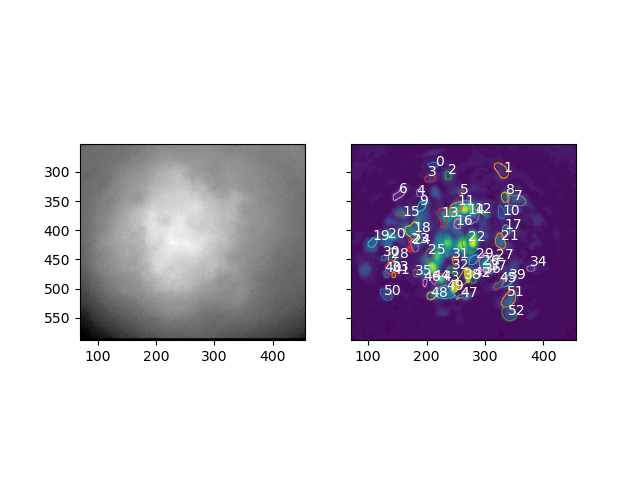

In [11]:
%matplotlib notebook
caneurons.plot_rois_with_min_proj(plot_max=True)

## Load in SWR times from folder

In [12]:
from neuropy.core.epoch import Epoch
sess.ripple= Epoch(epochs=None, file=sess.filePrefix.with_suffix('.ripple_curated.npy'))
sess.ripple.epochs = sess.ripple.to_dataframe()
print(f'{sess.ripple.epochs["good_ripple"].sum()} hand-curated ripples detected')

574 hand-curated ripples detected


In [18]:
# Load in timestamps to all ripples
from neuropy.io.openephysio import get_dat_timestamps, get_lfp_timestamps
timestamps = get_lfp_timestamps(sess.basepath)

start time = 2022-01-20 12:28:41.457273-05:00
start time = 2022-01-20 12:41:05.080921-05:00
start time = 2022-01-20 12:49:07.058155-05:00
start time = 2022-01-20 13:11:28.552226-05:00
start time = 2022-01-20 13:23:42.352374-05:00
start time = 2022-01-20 15:04:44.374794-05:00
start time = 2022-01-20 15:52:30.413963-05:00
start time = 2022-01-20 15:52:30.413963-05:00


In [19]:
# Check # frames in timestamps matches that of eeg file
if sess.eegfile.n_frames == timestamps.shape[0]:
    print('# frames in timestamps file and eegfile match. Good to go!')

# frames in timestamps file and eegfile match. Good to go!


In [20]:
# Import eeg_times
eeg_times = pd.DataFrame({'frame': np.arange(sess.eegfile.n_frames), 
                          'time (s)': np.arange(sess.eegfile.n_frames)/sess.eegfile.sampling_rate, 
                          'Timestamps': timestamps.loc[:, 0].dt.tz_localize(None)})
eeg_times

,frame,time (s),Timestamps
0,0,0.0000,2022-01-20 12:28:41.457273000
24,1,0.0008,2022-01-20 12:28:41.458073000
48,2,0.0016,2022-01-20 12:28:41.458873000
72,3,0.0024,2022-01-20 12:28:41.459673000
96,4,0.0032,2022-01-20 12:28:41.460473000
...,...,...,...
25627536,21629158,17303.3264,2022-01-20 17:28:07.796896333
25627560,21629159,17303.3272,2022-01-20 17:28:07.797696333
25627584,21629160,17303.3280,2022-01-20 17:28:07.798496333
25627608,21629161,17303.3288,2022-01-20 17:28:07.799296333


In [21]:
# Now insert timestamps for all ripples!
start_frames = np.interp(sess.ripple.epochs['start'], eeg_times['time (s)'], eeg_times['frame']).astype(int)
stop_frames = np.interp(sess.ripple.epochs['stop'], eeg_times['time (s)'], eeg_times['frame']).astype(int)

sess.ripple.epochs.insert(5, 'Start Timestamp', eeg_times['Timestamps'].iloc[start_frames].values)
sess.ripple.epochs.insert(6, 'Stop Timestamp', eeg_times['Timestamps'].iloc[stop_frames].values)

In [22]:
sess.ripple.epochs

,start,stop,label,good_ripple,duration,Start Timestamp,Stop Timestamp
0,31.3800,31.5512,,False,0.1712,2022-01-20 12:29:12.837273,2022-01-20 12:29:13.008473000
1,39.2016,39.3032,,True,0.1016,2022-01-20 12:29:20.658873,2022-01-20 12:29:20.760473000
2,54.5928,54.7520,,True,0.1592,2022-01-20 12:29:36.050073,2022-01-20 12:29:36.209273000
3,55.7632,55.8688,,False,0.1056,2022-01-20 12:29:37.220473,2022-01-20 12:29:37.326073000
4,74.2368,74.5176,,True,0.2808,2022-01-20 12:29:55.694073,2022-01-20 12:29:55.974872999
...,...,...,...,...,...,...,...
2160,12633.7528,12633.8808,,False,0.1280,2022-01-20 16:10:15.270763,2022-01-20 16:10:15.398763000
2161,13467.1144,13467.2488,,False,0.1344,2022-01-20 16:24:08.632363,2022-01-20 16:24:08.766763000
2162,13626.4568,13626.6064,,False,0.1496,2022-01-20 16:26:47.974763,2022-01-20 16:26:48.124363000
2163,13642.3336,13642.5024,,False,0.1688,2022-01-20 16:27:03.851563,2022-01-20 16:27:04.020363000


## Now plot traces!!!
Code below will plot overlaid traces. Tweak it and dump into rasters and plot heatplots?

In [ ]:
sess.miniscope.minian['curated_neurons']

In [ ]:
sess.miniscope.minian

In [ ]:
# Save these files for easy debugging
from pickle import dump

file_names = ['ms_times_all_debug.pkl', 'minian_debug.pkl', 'swr_epochs_debug.pkl']
debug_vars = [sess.miniscope.times_all, sess.miniscope.minian, sess.ripple.epochs]
for var, file in zip(debug_vars, file_names):
    with open(sess.basepath / file, 'wb') as f:
        dump(var, f)


<IPython.core.display.Javascript object>


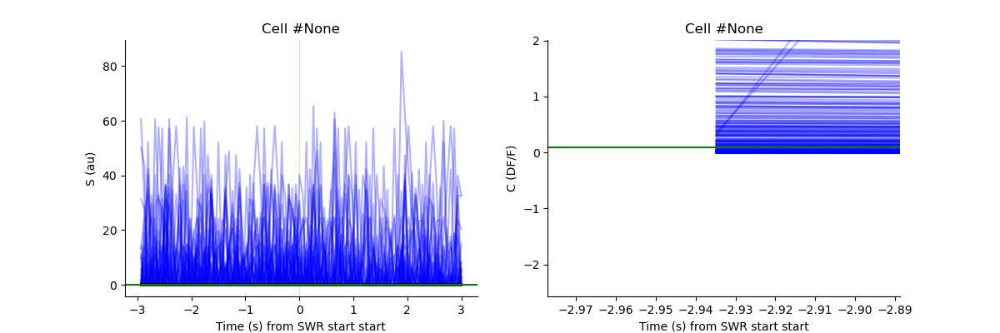

<IPython.core.display.Javascript object>


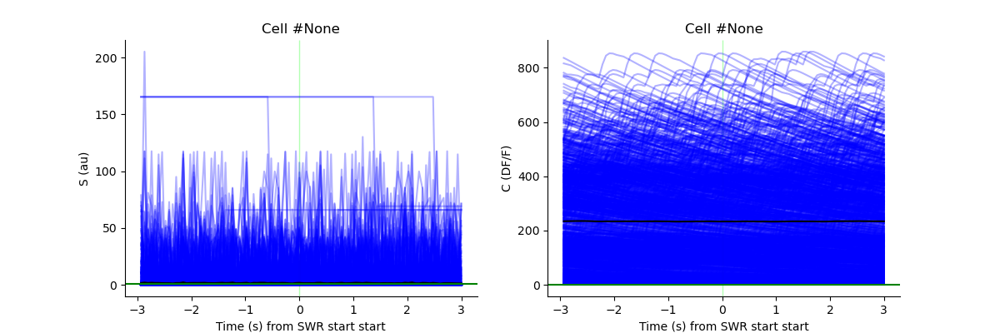

<IPython.core.display.Javascript object>


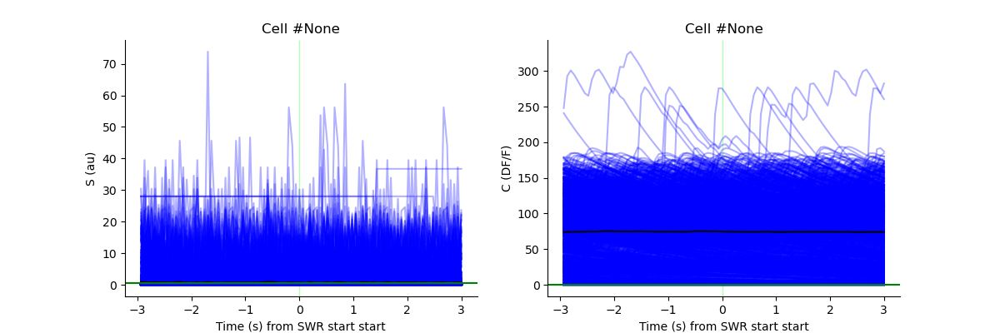

<IPython.core.display.Javascript object>


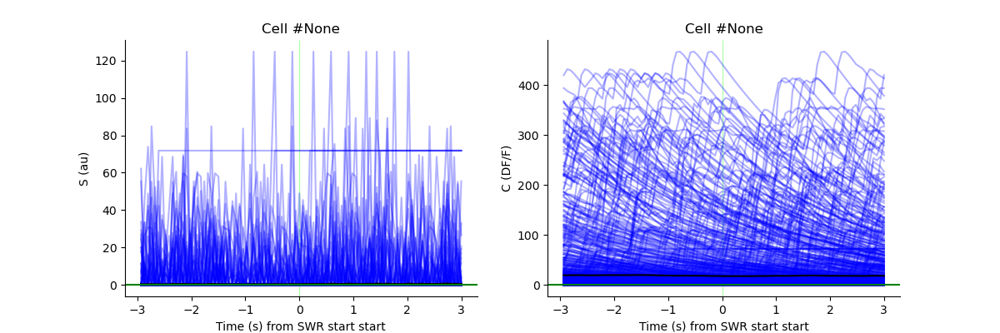

<IPython.core.display.Javascript object>


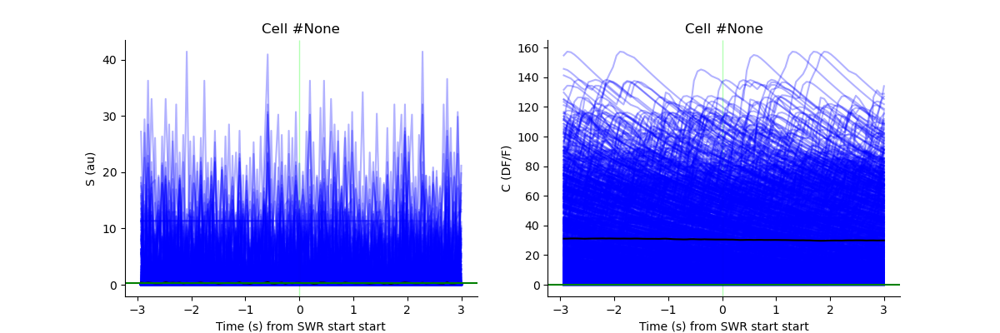

<IPython.core.display.Javascript object>


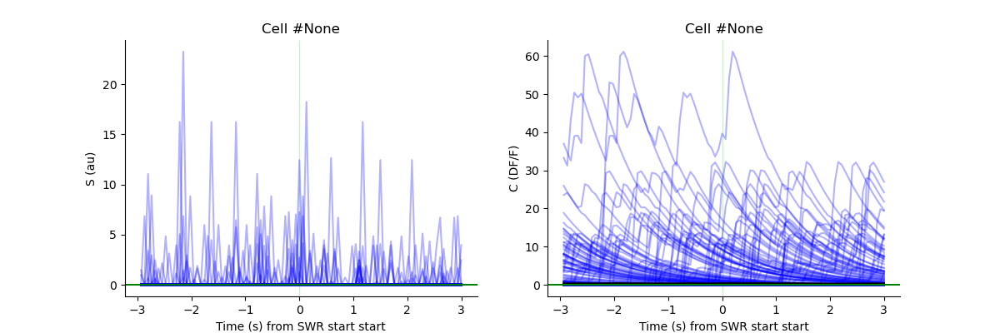

<IPython.core.display.Javascript object>


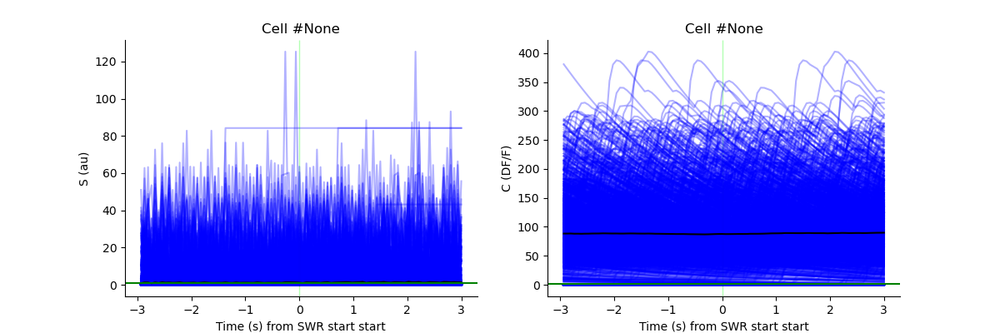

<IPython.core.display.Javascript object>


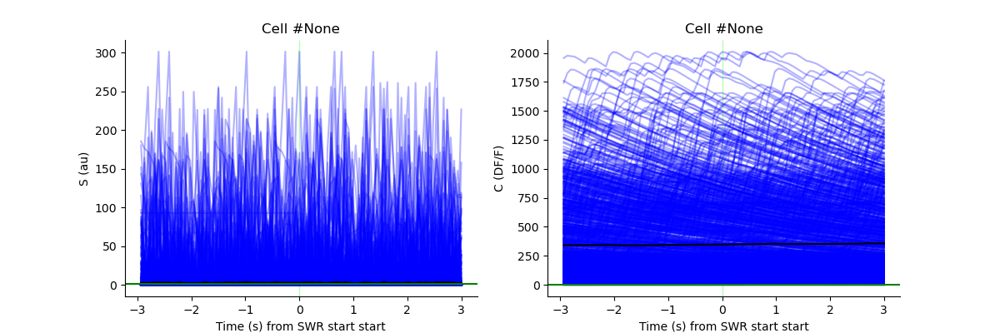

<IPython.core.display.Javascript object>


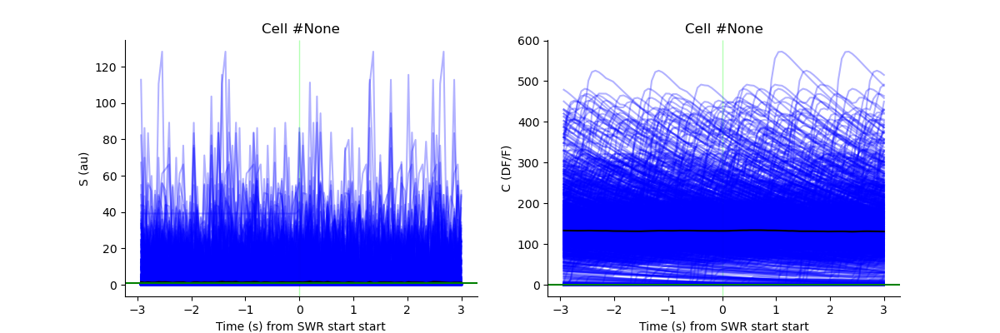

<IPython.core.display.Javascript object>


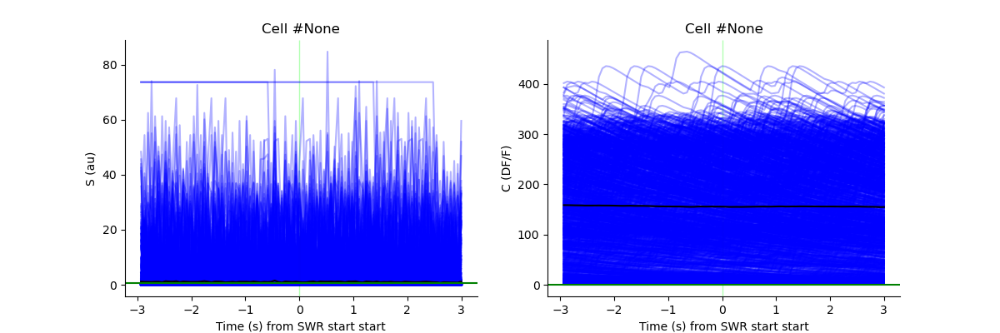

<IPython.core.display.Javascript object>


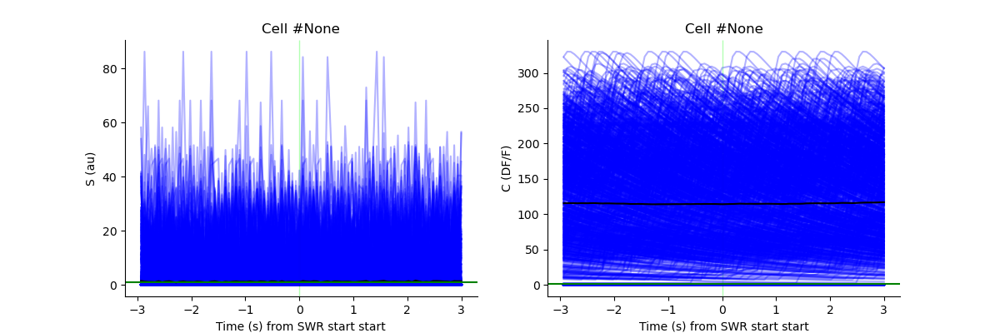

<IPython.core.display.Javascript object>


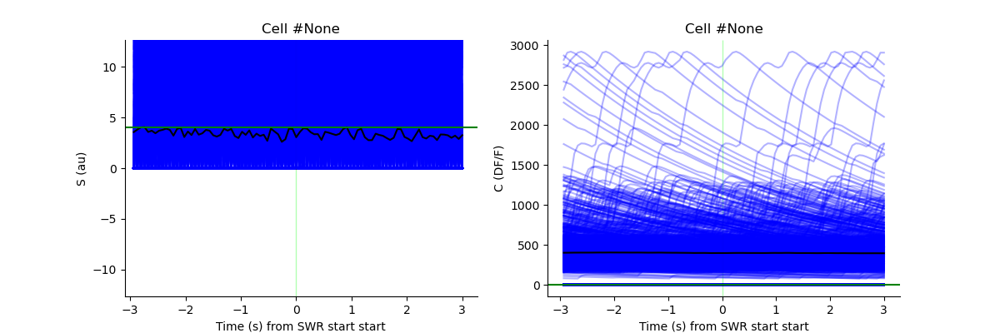

<IPython.core.display.Javascript object>


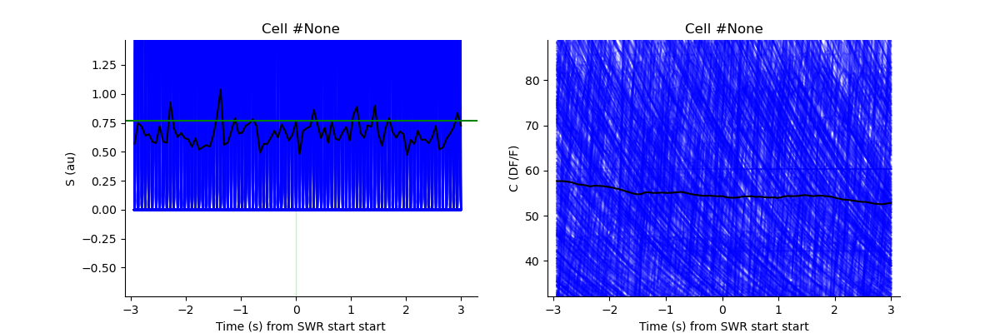

<IPython.core.display.Javascript object>


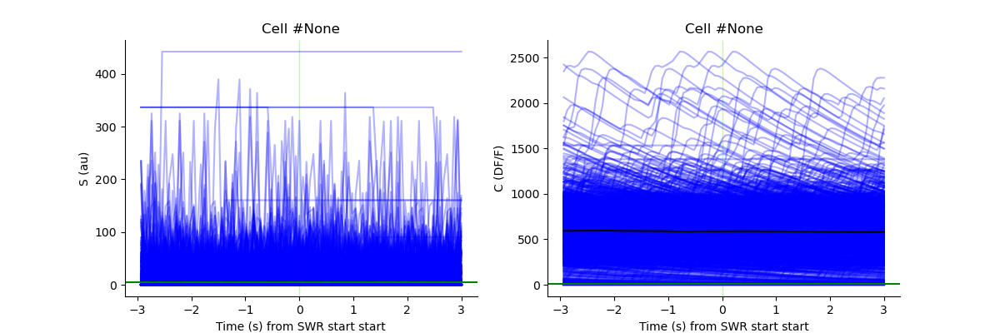

<IPython.core.display.Javascript object>


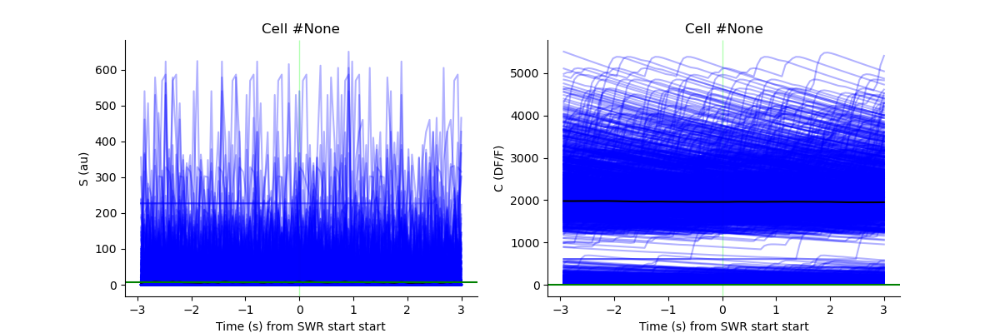

<IPython.core.display.Javascript object>


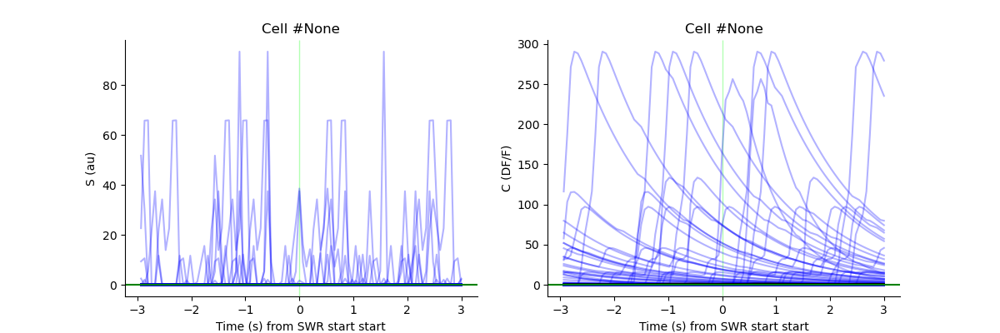

<IPython.core.display.Javascript object>


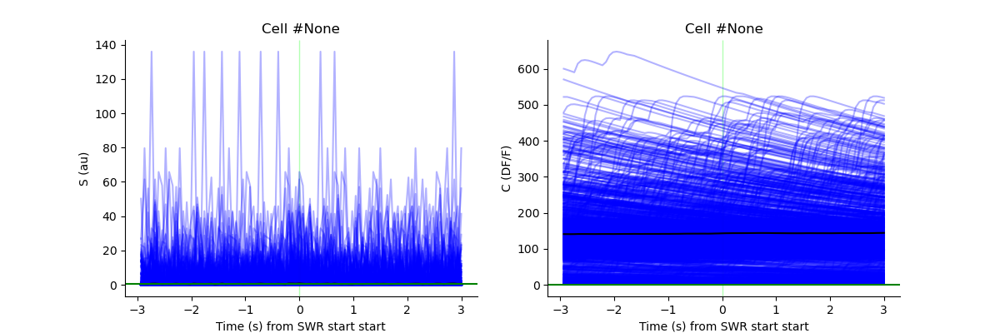

<IPython.core.display.Javascript object>


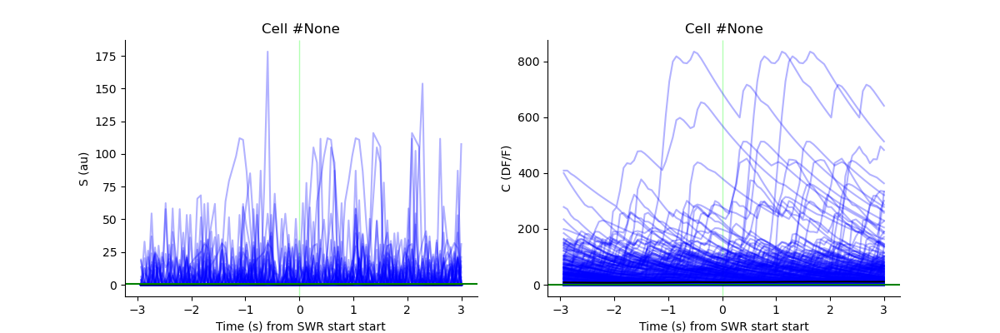

<IPython.core.display.Javascript object>


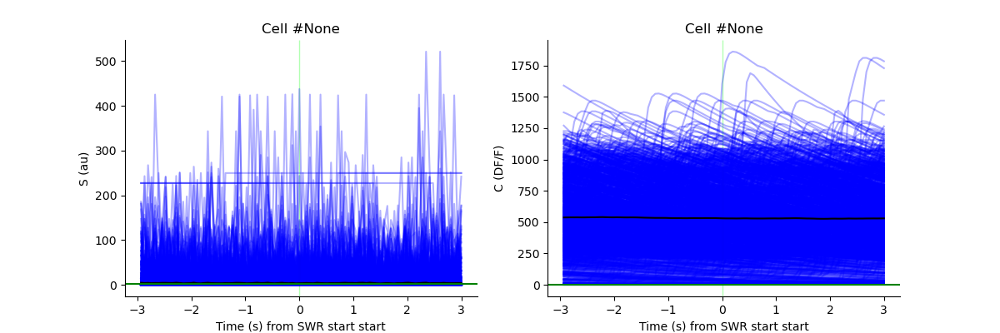

<IPython.core.display.Javascript object>


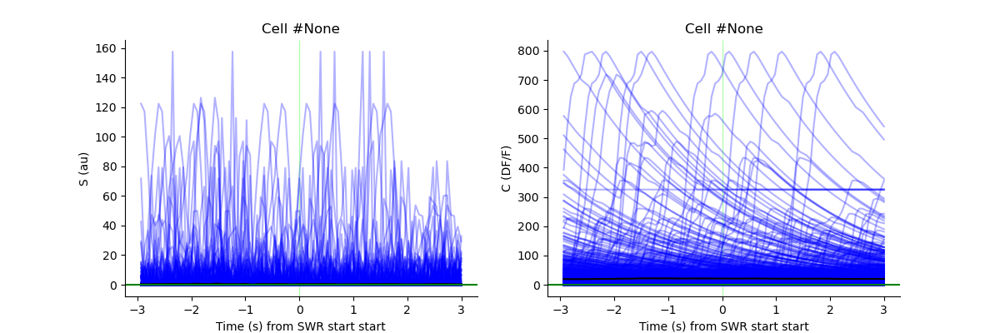

/data/GitHub/NeuroPy/neuropy/plotting/ca_events.py:507: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 2)


<IPython.core.display.Javascript object>


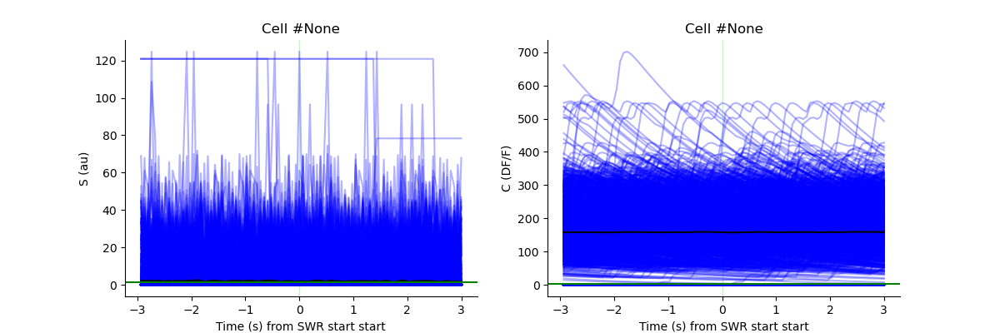

<IPython.core.display.Javascript object>


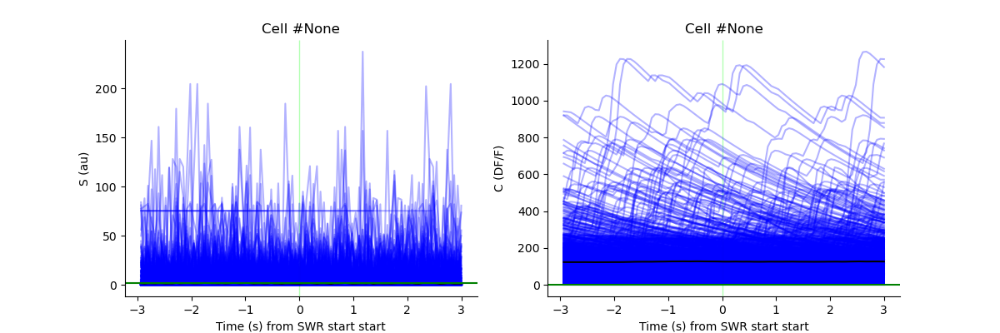

<IPython.core.display.Javascript object>


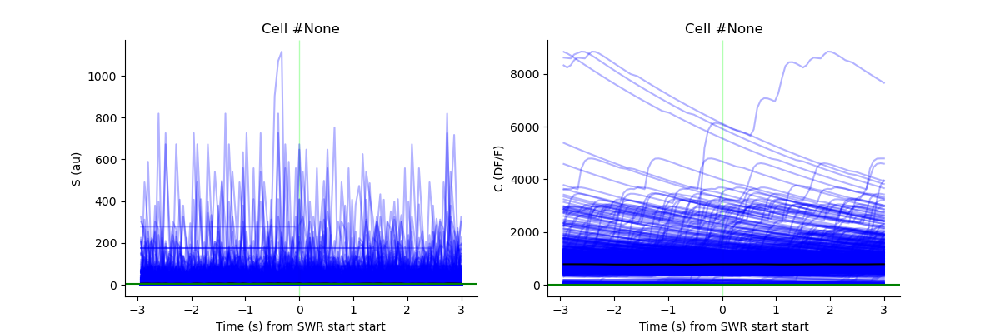

<IPython.core.display.Javascript object>


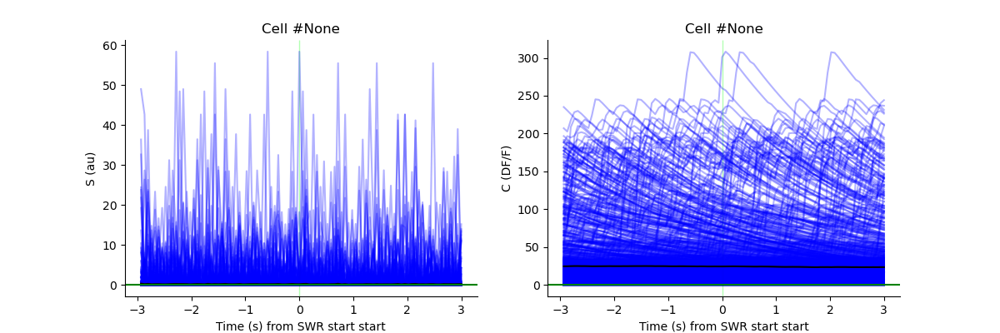

<IPython.core.display.Javascript object>


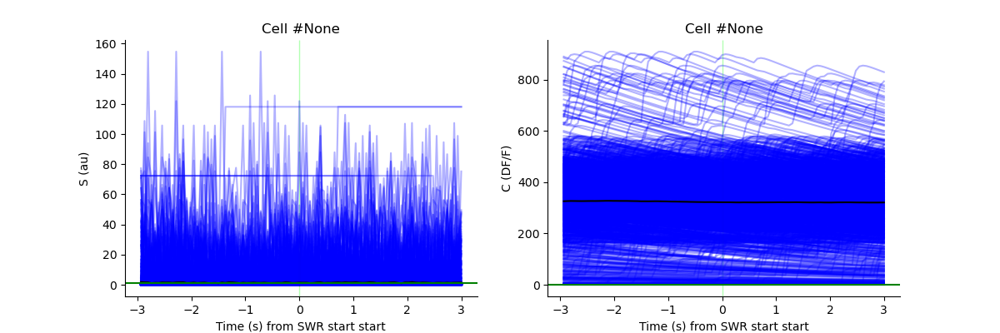

<IPython.core.display.Javascript object>


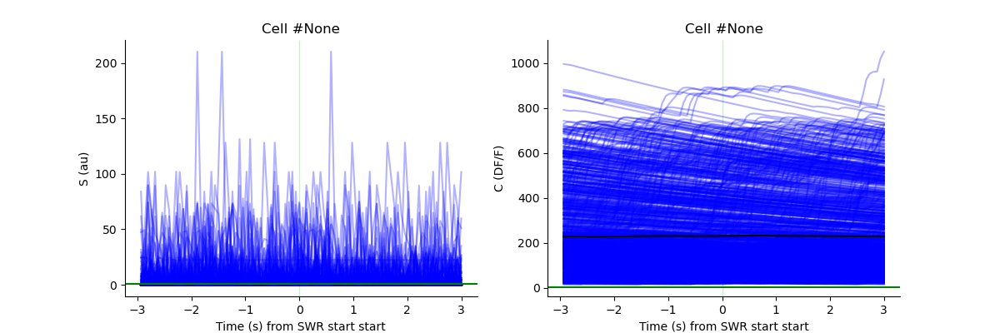

<IPython.core.display.Javascript object>


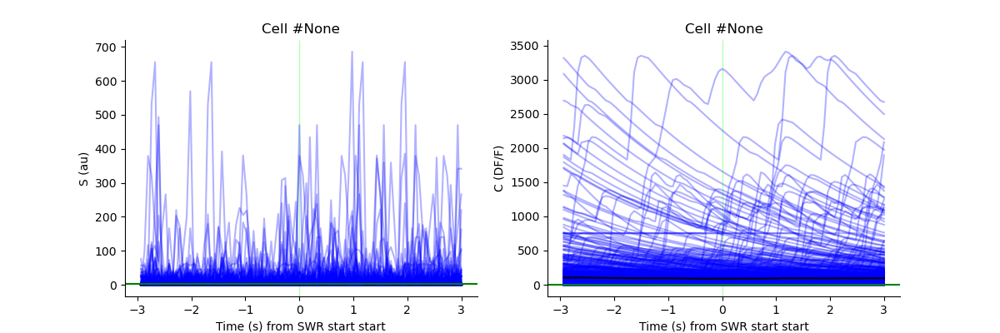

<IPython.core.display.Javascript object>


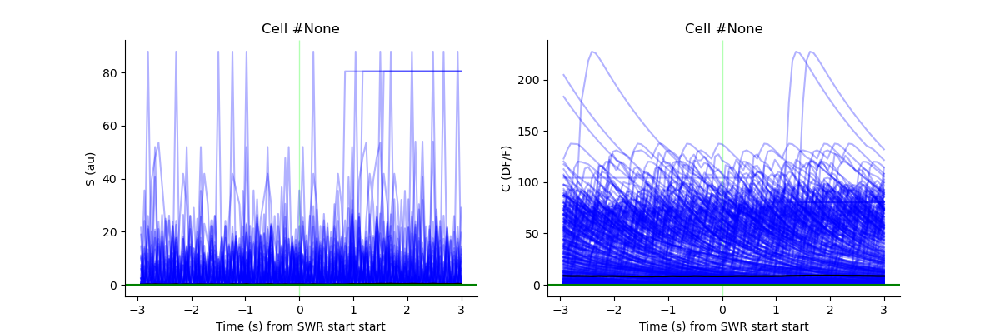

<IPython.core.display.Javascript object>


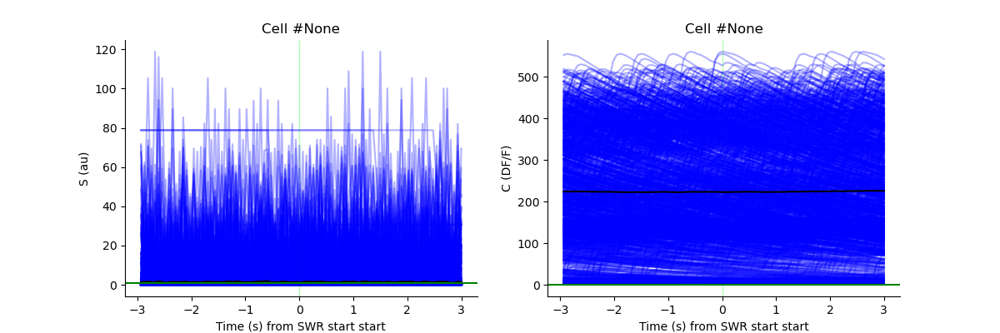

<IPython.core.display.Javascript object>


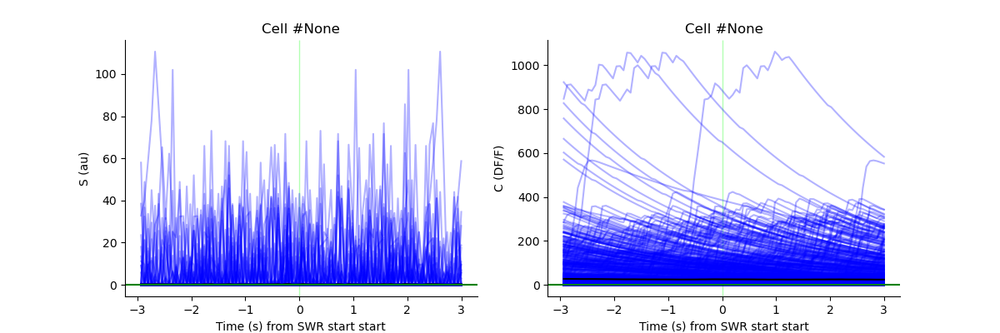

<IPython.core.display.Javascript object>


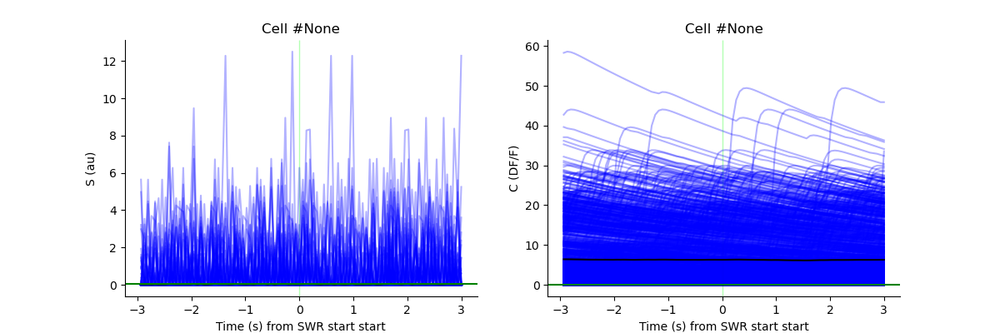

<IPython.core.display.Javascript object>


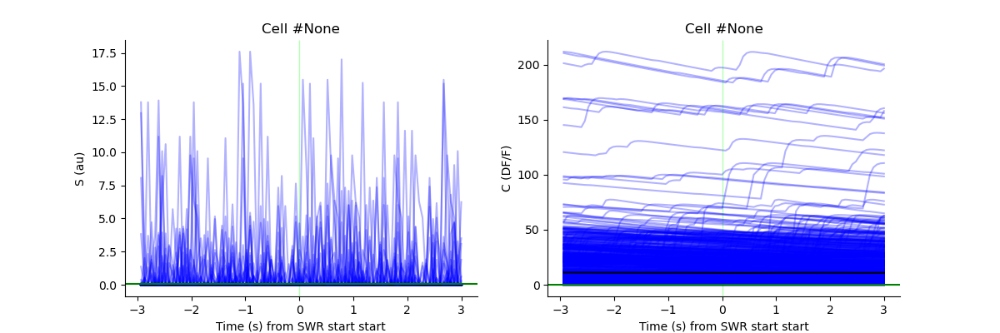

<IPython.core.display.Javascript object>


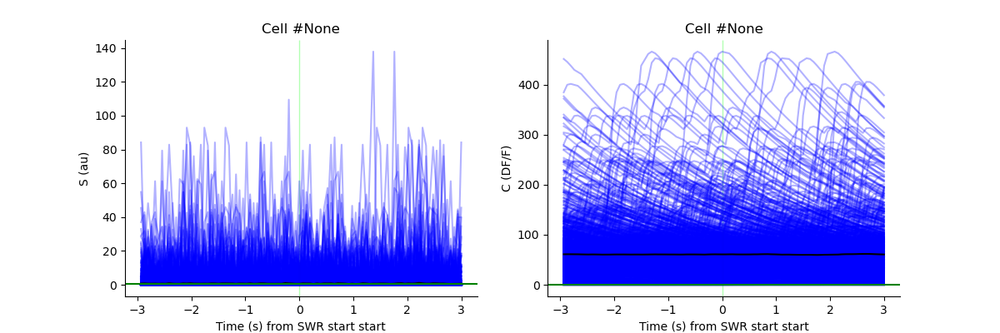

<IPython.core.display.Javascript object>


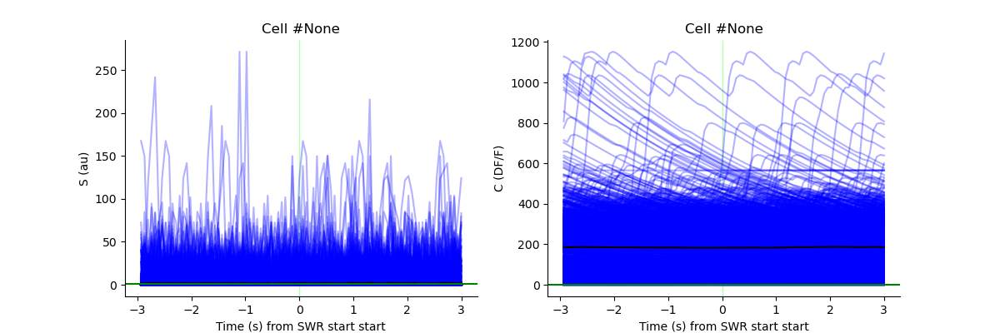

<IPython.core.display.Javascript object>


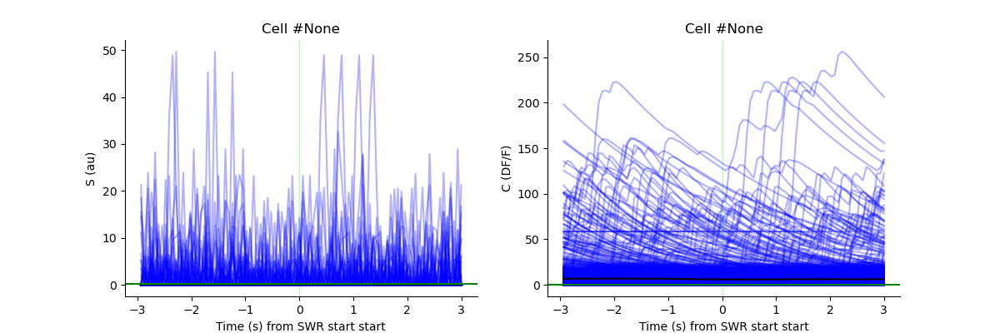

<IPython.core.display.Javascript object>


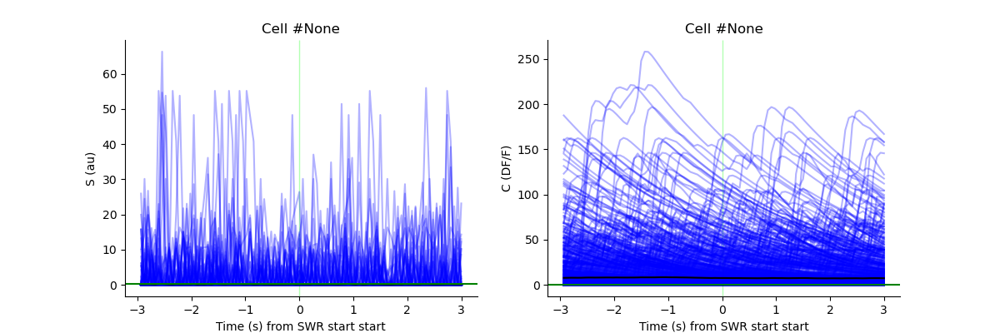

<IPython.core.display.Javascript object>


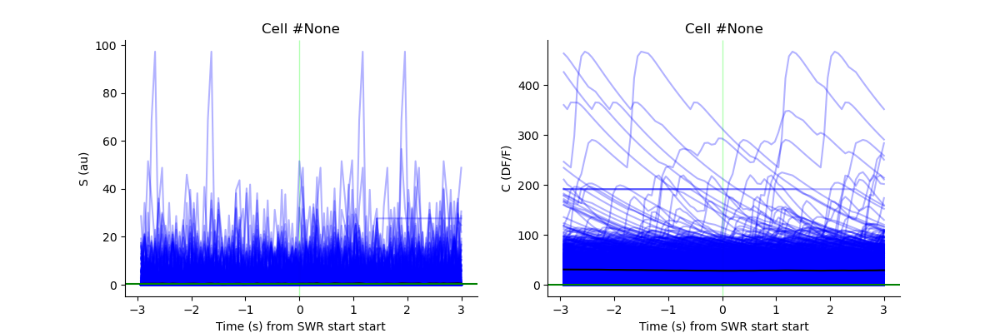

<IPython.core.display.Javascript object>


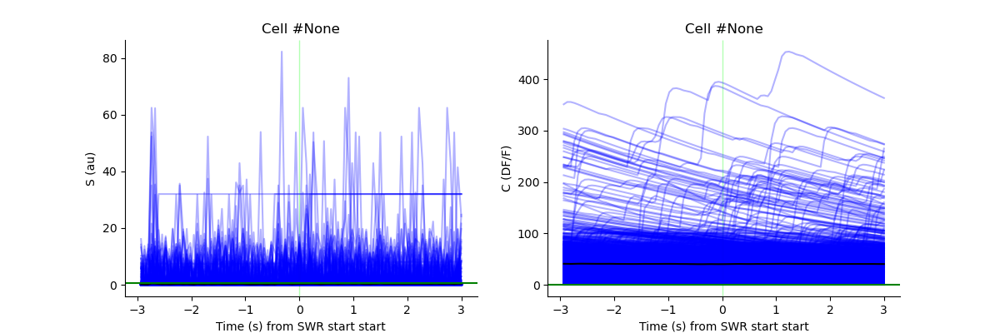

<IPython.core.display.Javascript object>


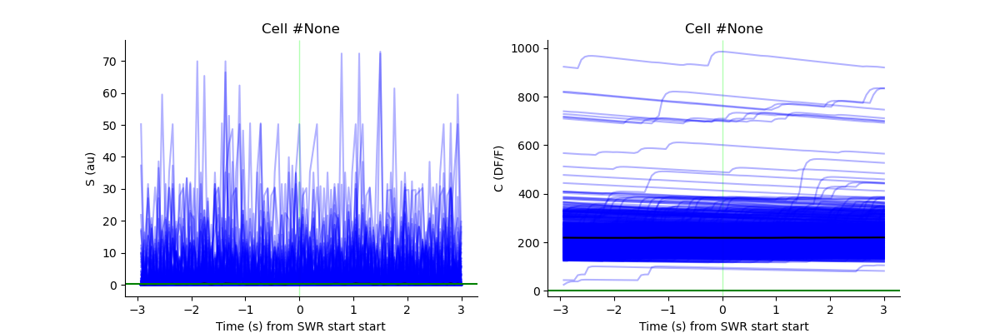

<IPython.core.display.Javascript object>


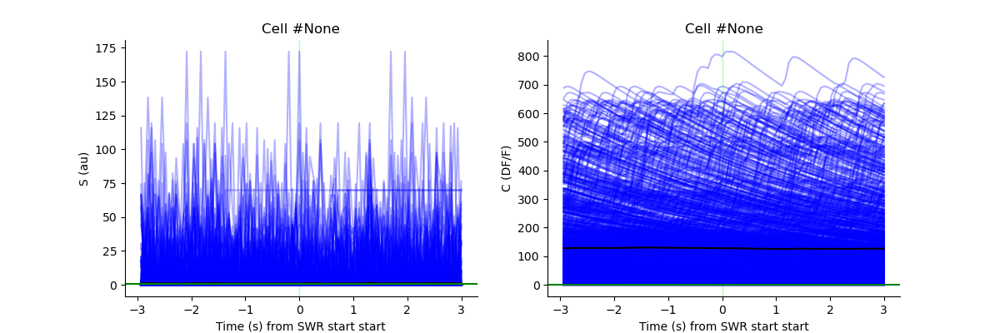

<IPython.core.display.Javascript object>


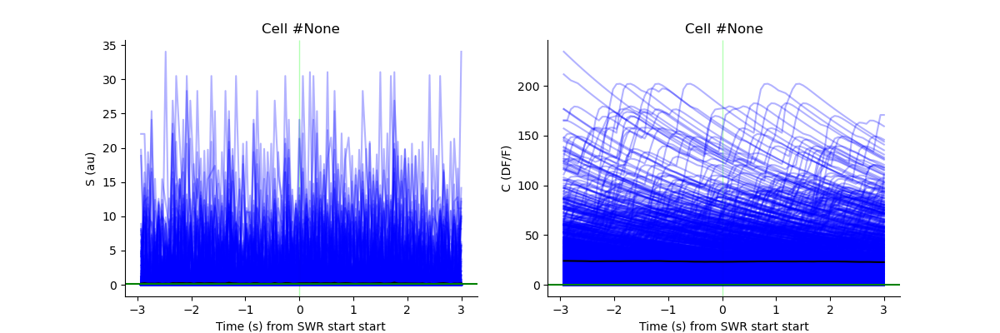

<IPython.core.display.Javascript object>


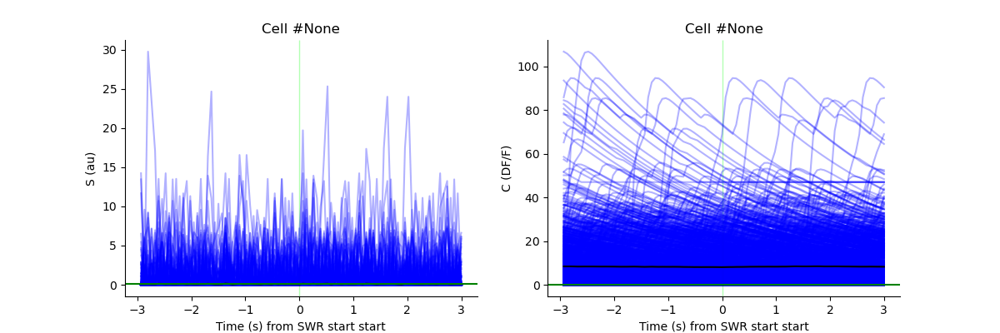

<IPython.core.display.Javascript object>


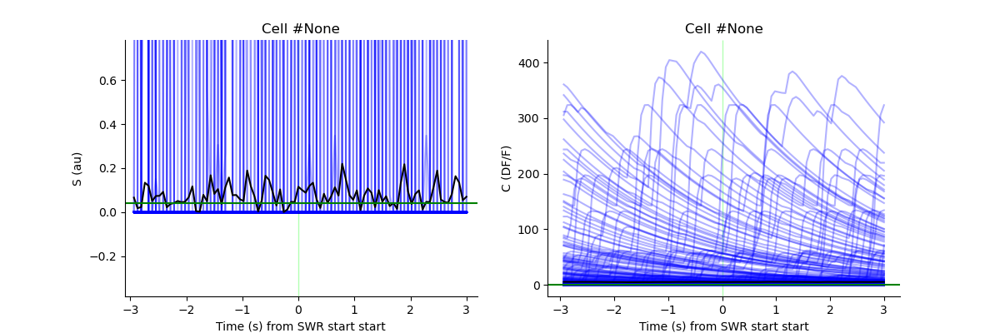

<IPython.core.display.Javascript object>


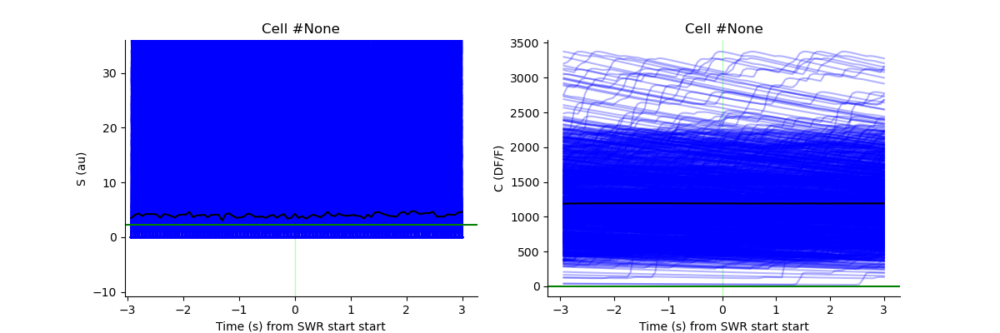

<IPython.core.display.Javascript object>


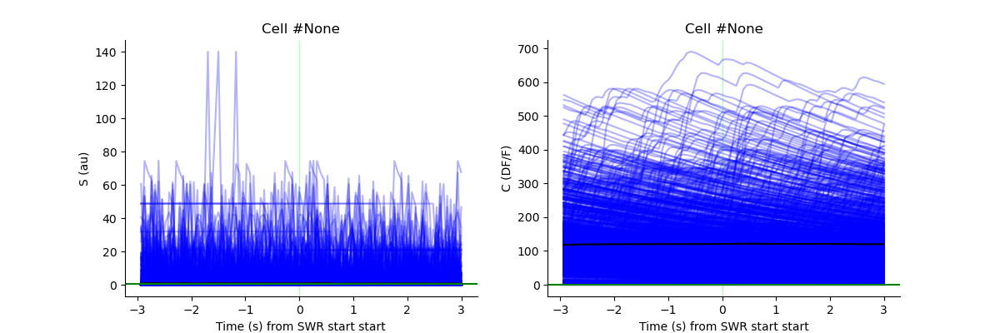

<IPython.core.display.Javascript object>


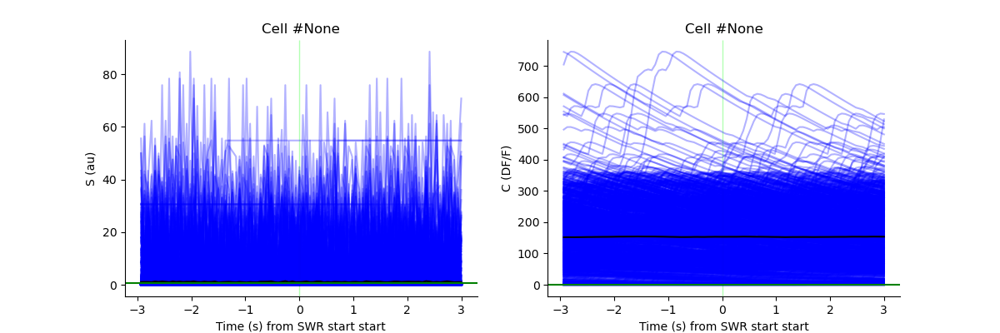

<IPython.core.display.Javascript object>


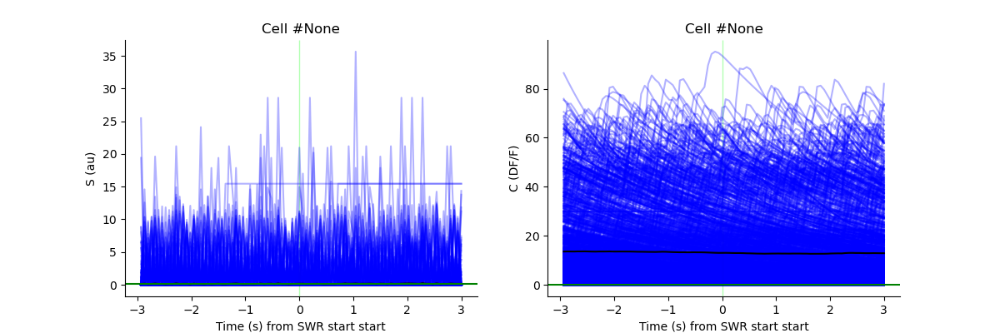

<IPython.core.display.Javascript object>


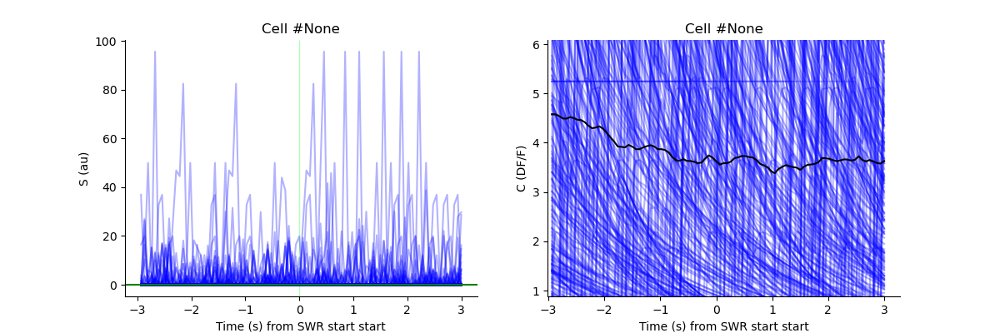

<IPython.core.display.Javascript object>


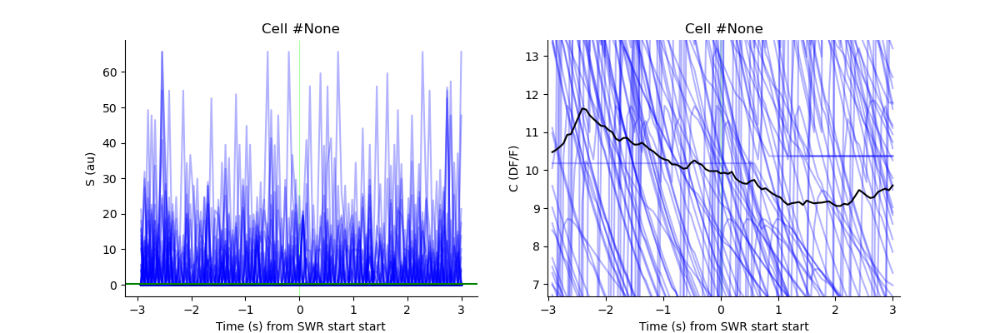

<IPython.core.display.Javascript object>


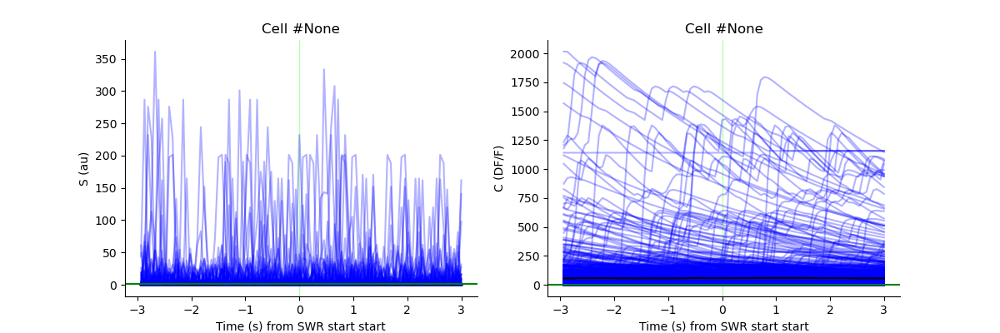

<IPython.core.display.Javascript object>


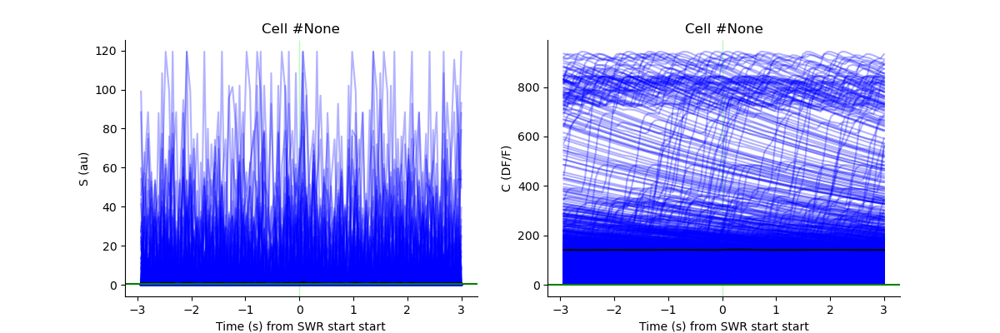

<IPython.core.display.Javascript object>


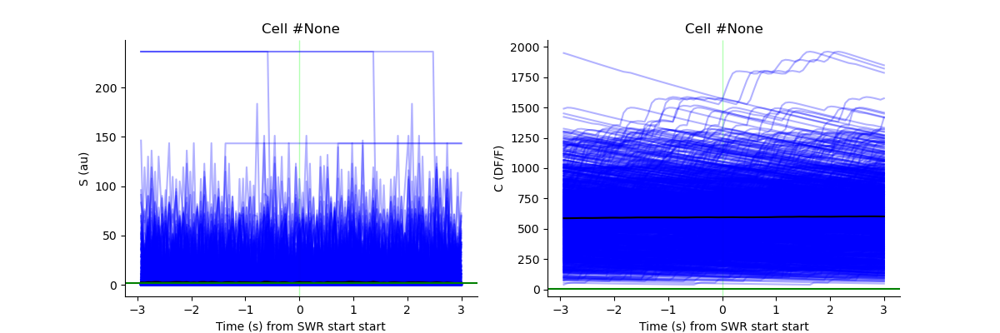

<IPython.core.display.Javascript object>


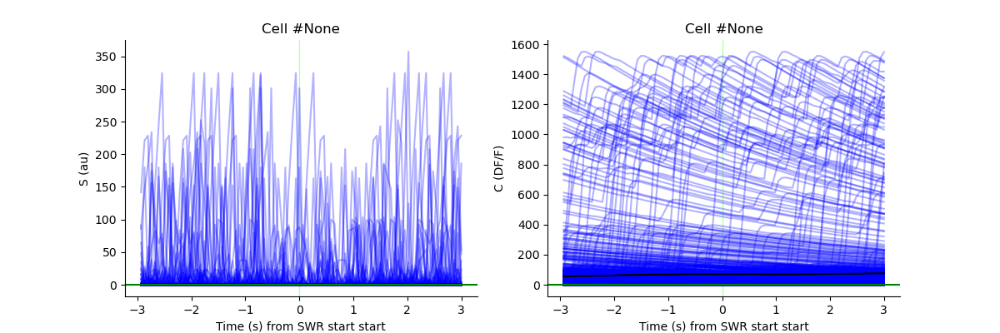

In [29]:
%matplotlib notebook
from neuropy.plotting.ca_events import plot_pe_traces

fig_list, raw_rast_array = [], []
nneurons = sess.caneurons.S.shape[0],
fig, ax = plt.subplots(nneurons, 2, figsize=(8.5, 3*nneurons))
for activity, raw_activity in zip(sess.caneurons.S, sess.caneurons.C):
    fig, _, _, _, _ = plot_pe_traces(sess.caneurons.t['Timestamps'], activity,
                                     sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']], 
                                     raw_trace=raw_activity, start_buffer_sec=3, 
                                     end_buffer_sec=3, event_type='SWR start', 
                                     ylabels=['S (au)', 'C (DF/F)'])
    fig_list.append(fig)

In [ ]:
%matplotlib notebook
from neuropy.plotting.ca_events import plot_pe_traces

cells_plot = [43]
fig_list, raw_rast_array = [], []
for cell in cells_plot:
    idc = np.where(cell == sess.miniscope.minian['unit_id'])[0][0]
    fig, ax, rast_array, raw_rast_array, time_plot = plot_pe_traces(sess.miniscope.times_all['Timestamps'], 
                                                    sess.miniscope.minian['S'],
                   sess.ripple.epochs['Start Timestamp'],  cell_id=idc,
                   raw_trace=sess.miniscope.minian['C'], start_buffer_sec=1.5, end_buffer_sec=1.5, 
                   event_type='CS start', ylabels=['S (au)', 'C (DF/F)'])
    fig_list.append(fig)

In [50]:
# Attempt to make a raster group and plot out a snake plot of all the neurons
sess.swr_rasts = RasterGroup(sess.caneurons.C, sess.caneurons.t['Timestamps'], 
                             sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']], 
                             None, cell_ids=None, start_buffer_sec=3, 
                             end_buffer_sec=3)

In [181]:
# Divide up events into two groups to check consistency
sess.swr_rasts1 = RasterGroup(sess.caneurons.C, sess.caneurons.t['Timestamps'], 
                             sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']][0::2], 
                             None, cell_ids=None, start_buffer_sec=3, 
                             end_buffer_sec=3)
sess.swr_rasts2 = RasterGroup(sess.caneurons.C, sess.caneurons.t['Timestamps'], 
                             sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']][1::2], 
                             None, cell_ids=None, start_buffer_sec=3, 
                             end_buffer_sec=3)

<IPython.core.display.Javascript object>


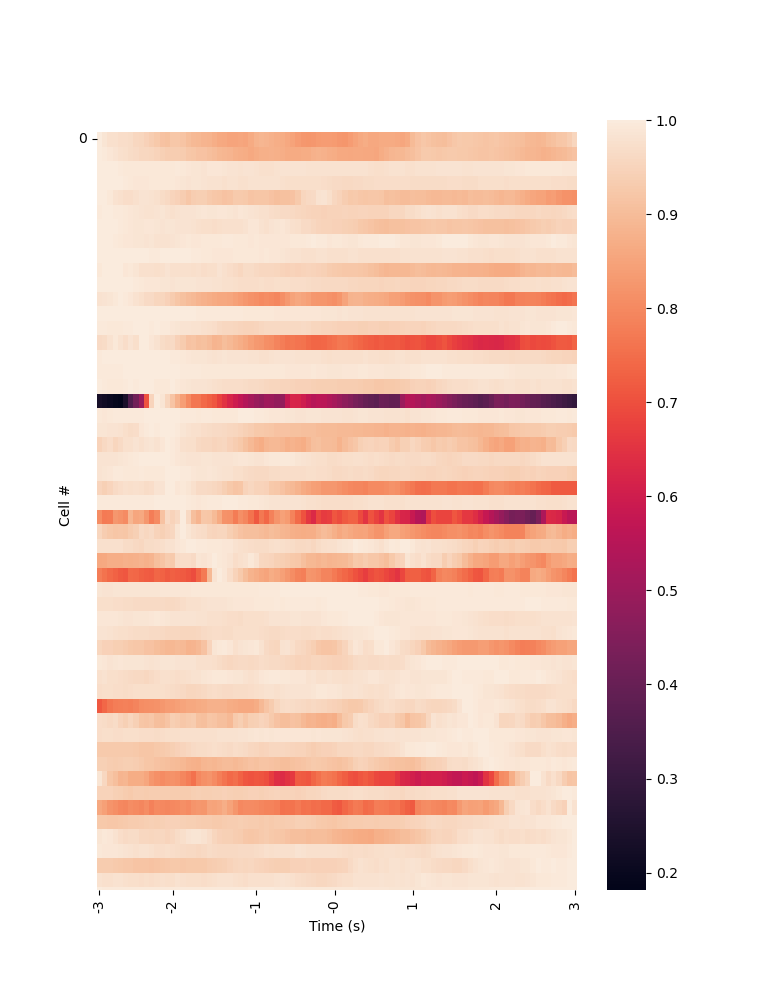

array([26, 36, 45,  9, 29, 31,  4, 20, 24, 46, 16, 49, 43,  7, 48,  1, 14,
       33, 15, 28, 32,  3,  8, 39,  0, 13,  5, 34, 23, 35, 42, 51, 25, 18,
       22, 19, 37, 21,  2, 52, 27, 44, 40, 12, 47,  6, 17, 11, 41, 10, 30,
       50, 38])

In [51]:
sess.swr_rasts.snake_plot(sortby="peak_time", xlabel_increment=1)

<IPython.core.display.Javascript object>


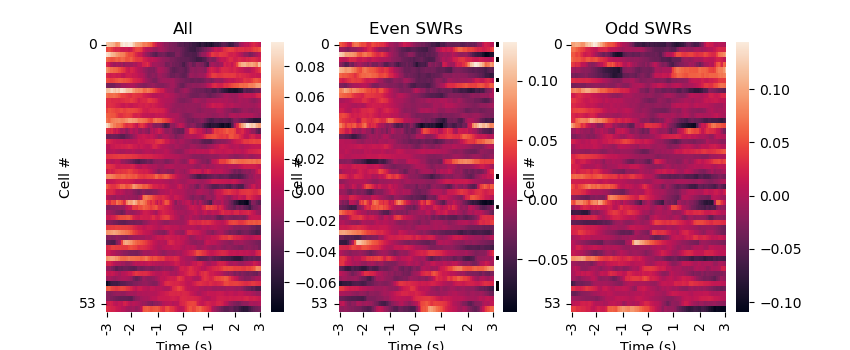

In [296]:
fig, ax = plt.subplots(1, 3, figsize=(8.5, 3.5))
mid_time = [-0.5, 0.5]
rast_time = sess.swr_rasts.Raster[0].raster_time
mid_bool = np.bitwise_and(rast_time < mid_time[1], rast_time > mid_time[0])
zmid_sum = []
for rast in sess.swr_rasts.Raster:
    rast_use = rast.raster
    rast_mean = rast.raster_mean
    
    zmid_sum.append(((rast_mean[mid_bool] - np.nanmean(rast_use.reshape(-1)))/
                    np.nanstd(rast_use.reshape(-1))).sum())

idzsort = np.argsort(zmid_sum)
for a, title_use, swr_rasts_use in zip(ax, ['All', 'Even SWRs', 'Odd SWRs'], 
                                   [sess.swr_rasts, sess.swr_rasts1, sess.swr_rasts2]):
    swr_rasts_use.snake_plot(sortby=idzsort, xlabel_increment=1, norm_each_row="z", 
                             ax=a)
    a.set_title(title_use)

In [301]:
94/92

1.0217391304347827

In [302]:
# Get consistency of SWR modulation for above plots
s1, _ = sess.swr_rasts1.sort_rasters(sortby=idzsort, norm_each_row='z')
s2, _ = sess.swr_rasts2.sort_rasters(sortby=idzsort, norm_each_row='z')

corrs = []
for cell1, cell2 in zip(s1, s2):
    corrs.append(np.corrcoef(cell1, cell2)[0][1])
corrs = np.array(corrs)

corrs_shuf = []
nshuf = 1000
for n in range(nshuf):
    np.random.shuffle(s2)
    corrs_temp = []
    for cell1, cell2 in zip(s1, s2):
        corrs_temp.append(np.corrcoef(cell1, cell2)[0][1])
    corrs_shuf.append(corrs_temp)
corrs_shuf = np.array(corrs_shuf)  

pconsist = (corrs[None, :] < corrs_shuf).sum(axis=0)/nshuf
print(pconsist)

# Label significantly consistent rows
pthresh = 0.1
trans = ax[1].get_yaxis_transform()
nbins = swr_rasts_use.Raster[0].raster.shape[1]
for py in np.where(pconsist < pthresh):
    ax[1].plot([nbins*1.02]*2, [py + 0.2, py+0.5], color='k', linewidth=2, clip_on=False)

/data/GitHub/NeuroPy/neuropy/plotting/ca_events.py:544: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  "k",


[0.072 0.361 0.657 0.069 0.46  0.894 0.943 0.074 0.104 0.    0.403 0.407
 0.276 0.278 0.281 0.119 0.152 0.163 0.123 0.587 0.57  0.984 0.139 0.28
 0.578 0.336 0.025 0.7   0.402 0.386 0.91  0.338 0.113 0.986 0.425 0.344
 0.16  0.527 0.474 0.925 0.47  0.17  0.065 0.936 0.342 0.318 0.303 0.02
 0.017 0.329 0.224 0.532 0.789]


<IPython.core.display.Javascript object>


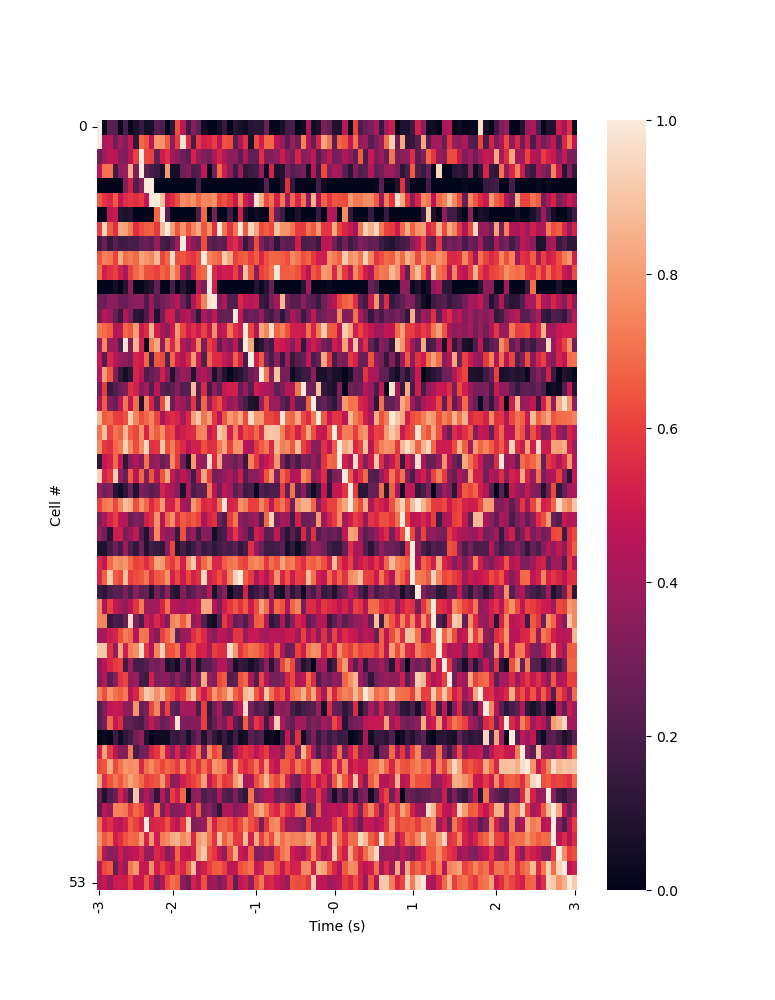

array([31, 23, 32, 48, 15, 21,  5, 44, 25, 13, 45, 42, 19, 27, 18, 35, 38,
       52, 29,  3,  2,  1, 11, 50, 39, 30, 14, 40, 37, 26, 51, 28, 17, 10,
       41, 33, 24, 49, 12,  9,  0, 16, 47, 46, 43,  8, 34,  7,  4, 20, 22,
        6, 36])

In [194]:
sess.swr_rastsS = RasterGroup(sess.caneurons.S, sess.caneurons.t['Timestamps'], 
                             sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']], 
                             None, cell_ids=None, start_buffer_sec=3, 
                             end_buffer_sec=3)

sess.swr_rastsS1 = RasterGroup(sess.caneurons.S, sess.caneurons.t['Timestamps'], 
                             sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']][0::2], 
                             None, cell_ids=None, start_buffer_sec=3, 
                             end_buffer_sec=3)
sess.swr_rastsS2 = RasterGroup(sess.caneurons.S, sess.caneurons.t['Timestamps'], 
                             sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']][1::2], 
                             None, cell_ids=None, start_buffer_sec=3, 
                             end_buffer_sec=3)
sess.swr_rastsS.snake_plot(sortby="peak_time", xlabel_increment=1)

<IPython.core.display.Javascript object>


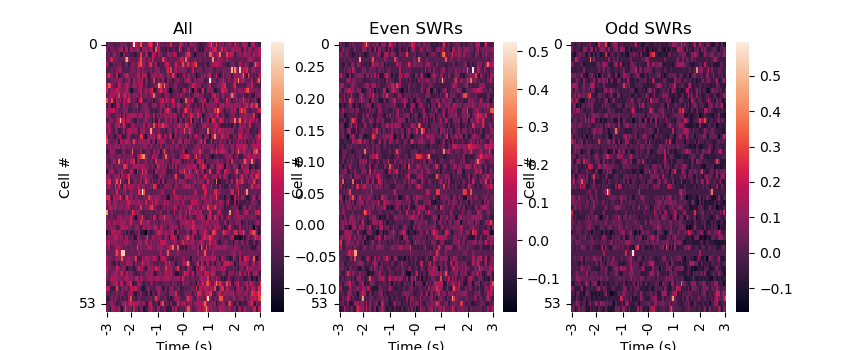

In [251]:
fig, ax = plt.subplots(1, 3, figsize=(8.5, 3.5))
mid_time = [0.5, 1]
rast_time = sess.swr_rastsS.Raster[0].raster_time
mid_bool = np.bitwise_and(rast_time < mid_time[1], rast_time > mid_time[0])
zmid_sum = []
for rast in sess.swr_rastsS.Raster:
    rast_use = rast.raster
    rast_mean = rast.raster_mean
    
    zmid_sum.append(((rast_mean[mid_bool] - np.nanmean(rast_use.reshape(-1)))/
                    np.nanstd(rast_use.reshape(-1))).sum())

idzsort = np.argsort(zmid_sum)
for a, title_use, swr_rasts_use in zip(ax, ['All', 'Even SWRs', 'Odd SWRs'], 
                                   [sess.swr_rastsS, sess.swr_rastsS1, sess.swr_rastsS2]):
    swr_rasts_use.snake_plot(sortby=idzsort, xlabel_increment=1, norm_each_row="z", ax=a)
    a.set_title(title_use)

In [252]:
# Get consistency of SWR modulation for above plots
s1, _ = sess.swr_rastsS1.sort_rasters(sortby=idzsort, norm_each_row='z')
s2, _ = sess.swr_rastsS2.sort_rasters(sortby=idzsort, norm_each_row='z')

corrs = []
for cell1, cell2 in zip(s1, s2):
    corrs.append(np.corrcoef(cell1, cell2)[0][1])
corrs = np.array(corrs)

corrs_shuf = []
nshuf = 100
for n in range(nshuf):
    np.random.shuffle(s2)
    corrs_temp = []
    for cell1, cell2 in zip(s1, s2):
        corrs_temp.append(np.corrcoef(cell1, cell2)[0][1])
    corrs_shuf.append(corrs_temp)
corrs_shuf = np.array(corrs_shuf)  

pconsistS = (corrs[None, :] < corrs_shuf).sum(axis=0)/nshuf
pconsistS

array([0.06, 0.57, 0.72, 0.32, 0.5 , 0.31, 0.72, 0.46, 0.07, 0.5 , 0.95,
       0.48, 0.61, 0.7 , 0.71, 0.07, 0.78, 0.75, 0.57, 0.96, 0.89, 0.29,
       0.56, 0.8 , 0.82, 0.  , 0.72, 0.58, 0.98, 0.89, 0.14, 0.76, 0.81,
       0.13, 0.73, 0.73, 0.56, 0.49, 0.08, 0.8 , 0.75, 0.82, 0.41, 0.54,
       0.79, 0.84, 0.47, 0.33, 0.36, 0.71, 0.6 , 0.22, 0.37])

/data/GitHub/NeuroPy/neuropy/plotting/ca_events.py:437: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  Plot peri-event calcium event traces. If using start and end times, assumes same event duration each time.


<IPython.core.display.Javascript object>


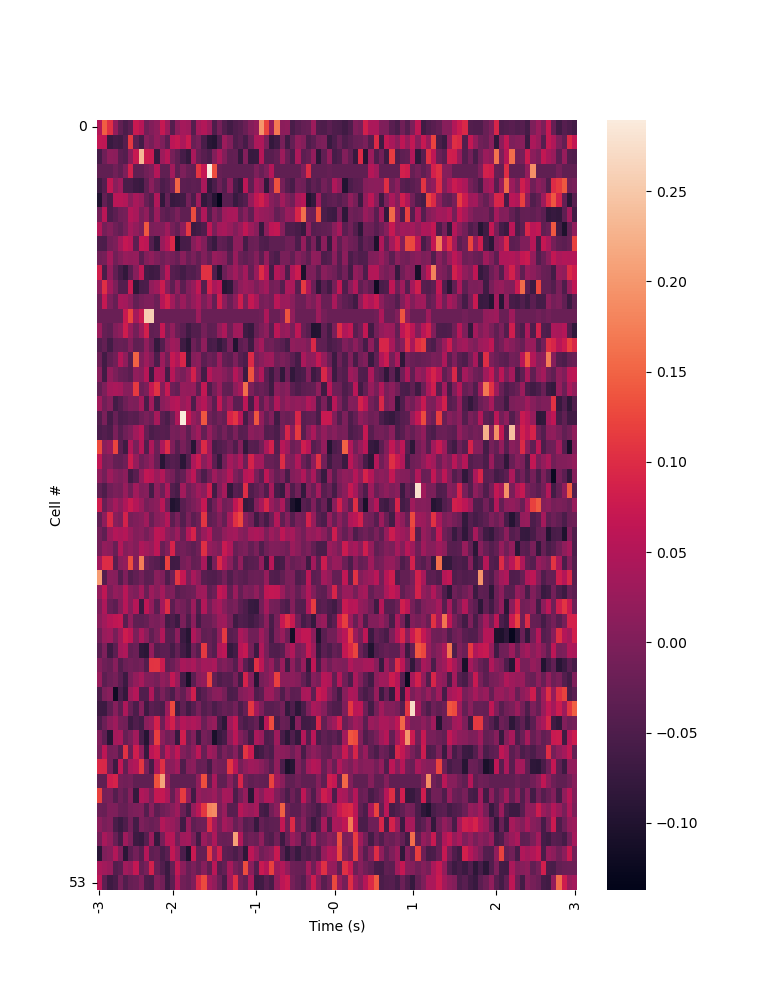

array([52, 41, 32, 42, 16,  7, 29,  4, 33, 43, 10, 46, 44, 15, 11, 36, 34,
       38,  0, 20, 25, 47, 39,  2,  9, 17,  8, 28, 51, 13, 48, 31,  1,  3,
       49, 14, 12, 21, 45,  6, 26, 40, 37, 35, 24,  5, 23, 19, 30, 27, 50,
       18, 22])

In [172]:
mid_time = 0.3
rast_time = sess.swr_rastsS.Raster[0].raster_time
mid_bool = np.bitwise_and(rast_time < mid_time, rast_time > -mid_time)
zmid_sum = []
for rast in sess.swr_rastsS.Raster:
    rast_use = rast.raster
    rast_mean = rast.raster_mean
    
    zmid_sum.append(((rast_mean[mid_bool] - np.nanmean(rast_use.reshape(-1)))/
                    np.nanstd(rast_use.reshape(-1))).sum())

idzsort = np.argsort(zmid_sum)
sess.swr_rastsS.snake_plot(sortby=idzsort, xlabel_increment=1, norm_each_row="z")

<IPython.core.display.Javascript object>


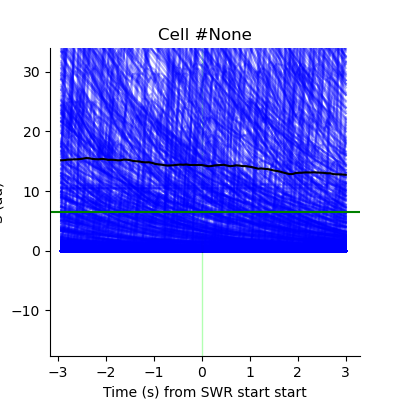

CPU times: user 13 s, sys: 17.5 ms, total: 13 s
Wall time: 13 s


In [86]:
%%time
fig, _, _, _, _ = plot_pe_traces(sess.caneurons.t['Timestamps'], sess.caneurons.C[0],
                                     sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']], 
                                     raw_trace=None, start_buffer_sec=3, 
                                     end_buffer_sec=3, event_type='SWR start', 
                                     ylabels=['S (au)', 'C (DF/F)'])

In [170]:
sess.ripple.epochs

,start,stop,label,good_ripple,duration,Start Timestamp,Stop Timestamp
0,31.3800,31.5512,,False,0.1712,2022-01-20 12:29:12.837273,2022-01-20 12:29:13.008473000
1,39.2016,39.3032,,True,0.1016,2022-01-20 12:29:20.658873,2022-01-20 12:29:20.760473000
2,54.5928,54.7520,,True,0.1592,2022-01-20 12:29:36.050073,2022-01-20 12:29:36.209273000
3,55.7632,55.8688,,False,0.1056,2022-01-20 12:29:37.220473,2022-01-20 12:29:37.326073000
4,74.2368,74.5176,,True,0.2808,2022-01-20 12:29:55.694073,2022-01-20 12:29:55.974872999
...,...,...,...,...,...,...,...
2160,12633.7528,12633.8808,,False,0.1280,2022-01-20 16:10:15.270763,2022-01-20 16:10:15.398763000
2161,13467.1144,13467.2488,,False,0.1344,2022-01-20 16:24:08.632363,2022-01-20 16:24:08.766763000
2162,13626.4568,13626.6064,,False,0.1496,2022-01-20 16:26:47.974763,2022-01-20 16:26:48.124363000
2163,13642.3336,13642.5024,,False,0.1688,2022-01-20 16:27:03.851563,2022-01-20 16:27:04.020363000


In [158]:
sess.caneurons.t

,Frame Number,Time Stamp (ms),Buffer Index,Timestamps
4,4,105,0,2022-01-20 12:29:27.572
5,5,138,0,2022-01-20 12:29:27.605
6,6,172,0,2022-01-20 12:29:27.639
7,7,206,0,2022-01-20 12:29:27.673
8,8,239,0,2022-01-20 12:29:27.706
...,...,...,...,...
6691,6691,450774,0,2022-01-20 17:27:27.661
6692,6692,450840,0,2022-01-20 17:27:27.727
6693,6693,450907,0,2022-01-20 17:27:27.794
6694,6694,450975,0,2022-01-20 17:27:27.862


In [162]:
bl, bl_bool = sess.swr_rasts.Raster[0].get_baseline(sess.swr_rasts.Raster[0].ca_activity[0],
                                                    sess.swr_rasts.Raster[0].times,
                                                    sess.swr_rasts.Raster[0].event_starts,
                                                    sess.swr_rasts.Raster[0].event_starts,
                                                    3, 3)

In [168]:
bl_start

Timestamp('2022-01-20 12:29:17.658873')

In [169]:
bl_end

Timestamp('2022-01-20 16:02:08.457163')

In [167]:
start_buffer_sec, end_buffer_sec = 3, 3
bl_start = sess.swr_rasts.Raster[0].event_starts.min() - pd.Timedelta(start_buffer_sec, unit="sec")
bl_end = sess.swr_rasts.Raster[0].event_starts.max() + pd.Timedelta(end_buffer_sec, unit="sec")

In [163]:
bl_bool.sum()

89808

In [140]:
sess.caneurons.C[0].mean()

5.443314322170781

## Test code to figure out why it is taking so long to generate these rasters!
Answer: much of it depends on using pandas for timestamps. Need to align things better ahead of time and just np.ndarrays!

In [125]:
 def get_start_ends_pd(event_starts, event_ends, times, activity, start_buffer_sec=3, end_buffer_sec=3):
    start_id, end_id, start_buffer_check, end_buffer_check = [], [], [], []
    avg_event_sec = 6
    for start, end in zip(event_starts, event_ends):
            # first, id neural data time for start, end and account for buffer times before/after
            start_id.append((times - start).dt.total_seconds().abs().argmin())
            start_buffer = (
                (times - (start - pd.Timedelta(start_buffer_sec, unit="sec")))
                .dt.total_seconds()
                .abs()
                .argmin()
            )
            start_buffer_check.append(start_buffer)
            end_id.append((times - end).dt.total_seconds().abs().argmin())
            end_buffer = (
                (
                    times
                    - (end + pd.Timedelta(end_buffer_sec + avg_event_sec, unit="sec"))
                )
                .dt.total_seconds()
                .abs()
                .argmin()
            )
            end_buffer_check.append(end_buffer)

            # Get time from event start for this event and keep only frames within buffer second
            # This is necessary to avoid grabbing frames super far away across a disconnect
            trial_dt = (times[start_buffer : end_buffer + 1] - start).dt.total_seconds()
            good_frame_bool = np.bitwise_and(
                trial_dt > -start_buffer_sec,
                trial_dt < (end_buffer_sec + avg_event_sec),
            )
            
    return start_id, end_id, start_buffer_check, end_buffer_check

In [126]:
 def get_start_ends_np(event_starts, event_ends, times, activity, start_buffer_sec=3, end_buffer_sec=3):
    start_id, end_id, start_buffer_check, end_buffer_check = [], [], [], []
    avg_event_sec = 6
    for start, end in zip(event_starts, event_ends):
            # first, id neural data time for start, end and account for buffer times before/after
            start_id.append(np.argmin(np.abs(times - start)))
            start_buffer = np.argmin(np.abs(times - (start - start_buffer_sec)))
            start_buffer_check.append(start_buffer)
            end_id.append(np.argmin(np.abs(times - end)))
            end_buffer = np.argmin(np.abs(times - (end + end_buffer_sec + avg_event_sec)))
            end_buffer_check.append(end_buffer)

            # Get time from event start for this event and keep only frames within buffer second
            # This is necessary to avoid grabbing frames super far away across a disconnect
            trial_dt = (times[start_buffer : end_buffer + 1] - start)
            good_frame_bool = np.bitwise_and(
                trial_dt > -start_buffer_sec,
                trial_dt < (end_buffer_sec + avg_event_sec),
            )
    
    return start_id, end_id, start_buffer_check, end_buffer_check

In [138]:
%%time
a, b, c, d = get_start_ends_pd(sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']],
                 sess.ripple.epochs['Stop Timestamp'][sess.ripple.epochs['good_ripple']],
                 sess.caneurons.t['Timestamps'],
                 sess.caneurons.C[0])

CPU times: user 3.22 s, sys: 1.91 ms, total: 3.22 s
Wall time: 3.23 s


In [171]:
%%time
start_time = sess.caneurons.t['Timestamps'].iloc[0]
event_starts_np = (sess.ripple.epochs['Start Timestamp'][sess.ripple.epochs['good_ripple']] - start_time).dt.total_seconds().values
event_ends_np = (sess.ripple.epochs['Stop Timestamp'][sess.ripple.epochs['good_ripple']] - start_time).dt.total_seconds().values
times_np = (sess.caneurons.t['Timestamps'] - start_time).dt.total_seconds().values
aa, bb, cc, dd = get_start_ends_np(event_starts_np, event_ends_np, times_np, activity)

CPU times: user 3.2 ms, sys: 0 ns, total: 3.2 ms
Wall time: 2.91 ms


[autoreload of neuropy.plotting.ca_events failed: Traceback (most recent call last):
  File "/home/nkinsky/miniconda3/envs/NeuroPy/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 257, in check
    superreload(m, reload, self.old_objects)
  File "/home/nkinsky/miniconda3/envs/NeuroPy/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 455, in superreload
    module = reload(module)
  File "/home/nkinsky/miniconda3/envs/NeuroPy/lib/python3.9/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 613, in _exec
  File "<frozen importlib._bootstrap_external>", line 846, in exec_module
  File "<frozen importlib._bootstrap_external>", line 983, in get_code
  File "<frozen importlib._bootstrap_external>", line 913, in source_to_code
  File "<frozen importlib._bootstrap>", line 228, in _call_with_frames_removed
  File "/data/GitHub/NeuroPy/neuropy/plotting/ca_events.py", line 253
    event_s